# Pleiotropy or linkage

Previously in GTEx V6 MASH analysis we have a list of 27 genes whose eQTL across brain tissues are in different directions compared to their effects in other tissues. We now run these genes through M&M.

## Methods overview

We run M&M with different residual covariances,

1. Using fixed diag residual covariance.
2. Using residual covariance estimated via FLASH.
3. Using z_null method as in MASH paper 2018.

## Get gene list

We have to see if the 27 genes still present in GTEx V8 data. Their ENSG version might also have changed. Here we figure out their current data files:

In [ ]:
%cd /project2/compbio/GTEx_eQTL/cis_eqtl_analysis_ready

In [3]:
genes = ['ENSG00000025772.7', 'ENSG00000056661.9', 'ENSG00000064012.17', 'ENSG00000089486.12', 'ENSG00000104472.5', 'ENSG00000108384.10', 'ENSG00000112977.11', 'ENSG00000120088.10', 'ENSG00000135744.7', 'ENSG00000136059.10', 'ENSG00000140265.8', 'ENSG00000145214.9', 'ENSG00000149054.10', 'ENSG00000160766.10', 'ENSG00000164124.6', 'ENSG00000177084.12', 'ENSG00000181240.9', 'ENSG00000187824.4', 'ENSG00000188732.6', 'ENSG00000189171.9', 'ENSG00000189316.3', 'ENSG00000198794.7', 'ENSG00000225439.2', 'ENSG00000249846.2', 'ENSG00000264247.1', 'ENSG00000267508.1', 'ENSG00000272030.1']
genes = [x.split('.')[0] for x in genes]

In [4]:
import glob
genes = sum([glob.glob(x + '*.Multi_Tissues.rds') for x in genes], [])

In [5]:
print(genes)

['ENSG00000025772.7.Multi_Tissues.rds', 'ENSG00000064012.21.Multi_Tissues.rds', 'ENSG00000089486.16.Multi_Tissues.rds', 'ENSG00000104472.9.Multi_Tissues.rds', 'ENSG00000108384.14.Multi_Tissues.rds', 'ENSG00000112977.15.Multi_Tissues.rds', 'ENSG00000120088.14.Multi_Tissues.rds', 'ENSG00000135744.7.Multi_Tissues.rds', 'ENSG00000136059.14.Multi_Tissues.rds', 'ENSG00000140265.12.Multi_Tissues.rds', 'ENSG00000145214.13.Multi_Tissues.rds', 'ENSG00000149054.15.Multi_Tissues.rds', 'ENSG00000160766.14.Multi_Tissues.rds', 'ENSG00000164124.10.Multi_Tissues.rds', 'ENSG00000177084.16.Multi_Tissues.rds', 'ENSG00000181240.13.Multi_Tissues.rds', 'ENSG00000187824.8.Multi_Tissues.rds', 'ENSG00000188732.10.Multi_Tissues.rds', 'ENSG00000189171.14.Multi_Tissues.rds', 'ENSG00000189316.3.Multi_Tissues.rds', 'ENSG00000198794.11.Multi_Tissues.rds', 'ENSG00000225439.2.Multi_Tissues.rds', 'ENSG00000249846.6.Multi_Tissues.rds', 'ENSG00000264247.1.Multi_Tissues.rds', 'ENSG00000267508.5.Multi_Tissues.rds', 'ENSG000

In [7]:
print(len(genes))

26


Now we have 26 left. We save them to file,

In [8]:
with open('../data/pleiotropy_genes.txt', 'w') as f:
    f.write('\n'.join([x.replace('.Multi_Tissues.rds', '') for x in genes]))

## Run M&M analysis

The pipeline can be found [here](https://github.com/stephenslab/mnm-twas/blob/master/pipelines/GTEx_V8_Association.ipynb). We run two analysis:

```
sos run GTEx_V8_Association.ipynb mnm --cov_method flash \
    --data-dir data --gene-id-file data/pleiotropy_genes.txt \
    --mash-model data/FastQTLSumStats.mash.FL_PC3.mash_model_est_v.rds

sos run GTEx_V8_Association.ipynb mnm --cov_method diag \
    --data-dir data --gene-id-file data/pleiotropy_genes.txt \
    --mash-model data/FastQTLSumStats.mash.FL_PC3.mash_model_est_v.rds

sos run GTEx_V8_Association.ipynb mnm --cov_method znull \
    --data-dir data --gene-id-file data/pleiotropy_genes.txt \
    --mash-model data/FastQTLSumStats.mash.FL_PC3.mash_model_est_v.rds 
```

The result is a PNG file figure containing 3 panels: PIP plot, effect size bubble plot from M&M and original univariate effect size bubble plot. Bubble plots focus on the CS identified. The "top" SNP (the SNP that has smallest p-value in the gene region, as we define the strong set in MASH) is in red shown on the 3rd panel. 

## The good

Using `flash` based residual covariance method,

> /home/gaow/ENSG00000177084.16.Multi_Tissues.mnm_flash.png (643.4 KiB):

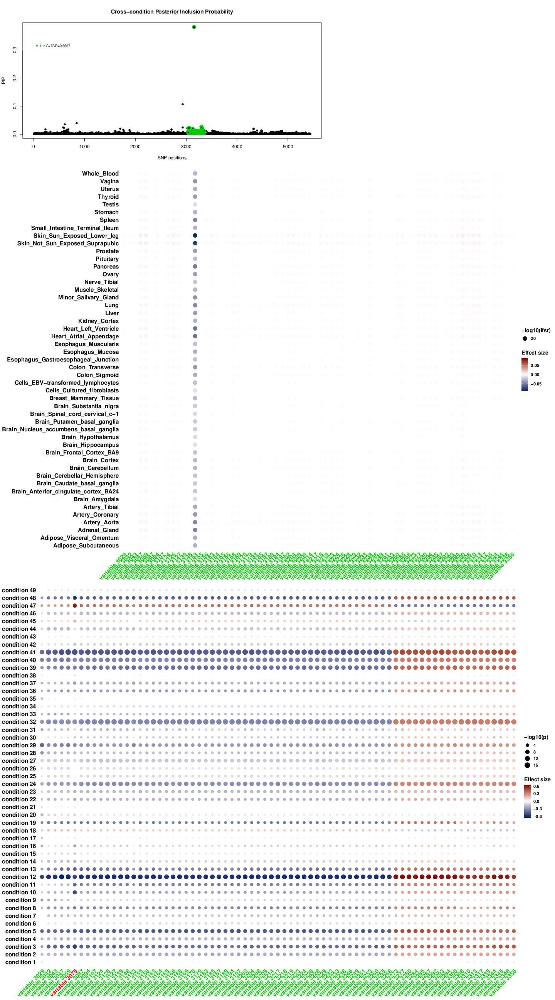

In [34]:
%preview ~/ENSG00000177084.16.Multi_Tissues.mnm_flash.png

> /home/gaow/ENSG00000104472.9.Multi_Tissues.mnm_flash.png (266.8 KiB):

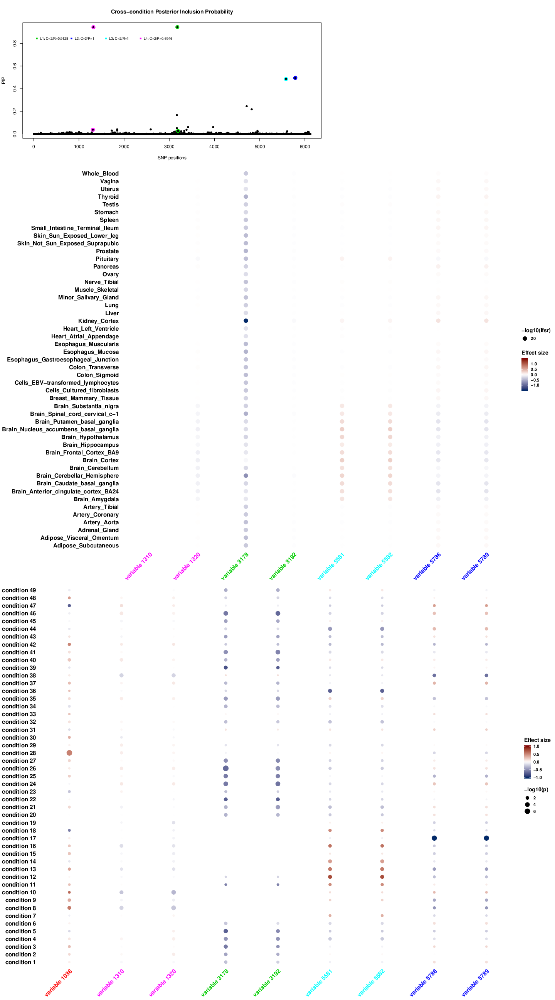

In [22]:
%preview ~/ENSG00000104472.9.Multi_Tissues.mnm_flash.png

The SNPs in cyan color have opposite effects in brain and non-brain tissues. M&M seems to resolve the problem. But I have reservations as there seems to be a lot CS discovered ...

> /home/gaow/ENSG00000135744.7.Multi_Tissues.mnm_flash.png (472.3 KiB):

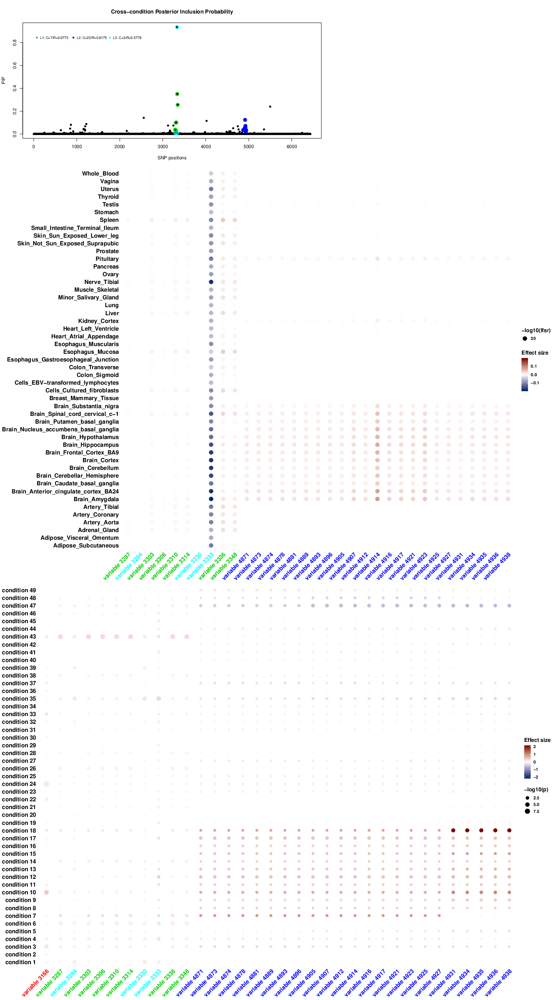

In [24]:
%preview ~/ENSG00000135744.7.Multi_Tissues.mnm_flash.png

Here, M&M seems to "sharpen" the causal SNPs by shrinking them to a brain specific and a shared set.

> /home/gaow/ENSG00000160766.14.Multi_Tissues.mnm_flash.png (323.1 KiB):

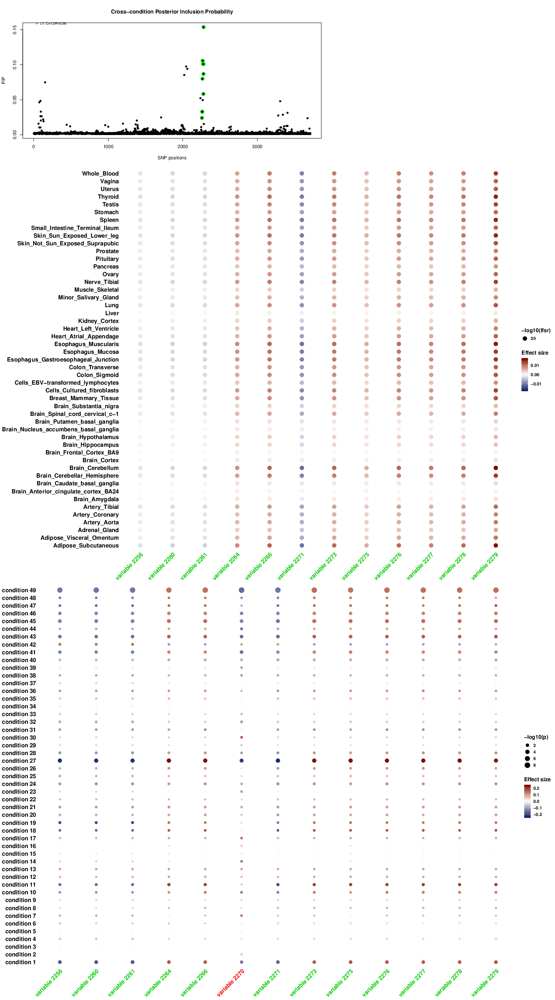

In [27]:
%preview ~/ENSG00000160766.14.Multi_Tissues.mnm_flash.png 

MASH shrinkage seems to help here, and below,

> /home/gaow/ENSG00000198794.11.Multi_Tissues.mnm_flash.png (291.0 KiB):

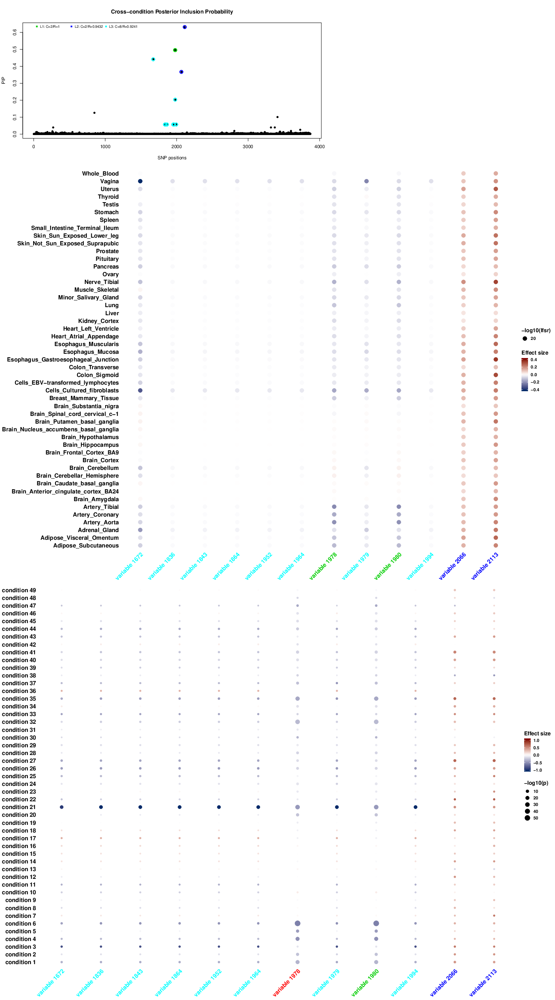

In [29]:
%preview ~/ENSG00000198794.11.Multi_Tissues.mnm_flash.png

## The ugly

> /home/gaow/ENSG00000136059.14.Multi_Tissues.mnm_flash.png (424.5 KiB):

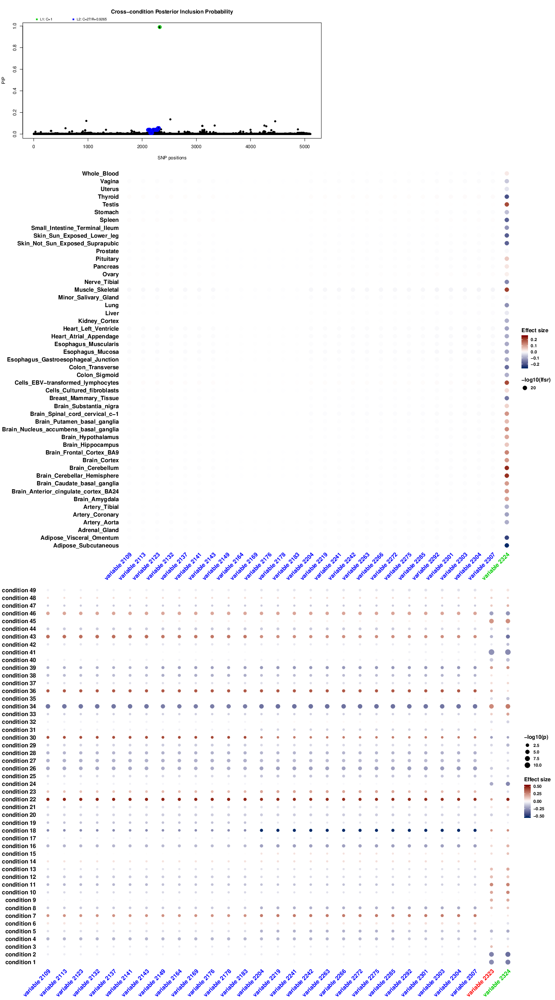

In [25]:
%preview ~/ENSG00000136059.14.Multi_Tissues.mnm_flash.png

So maybe it is a case of pleiotropy?

> /home/gaow/ENSG00000272030.1.Multi_Tissues.mnm_flash.png (617.7 KiB):

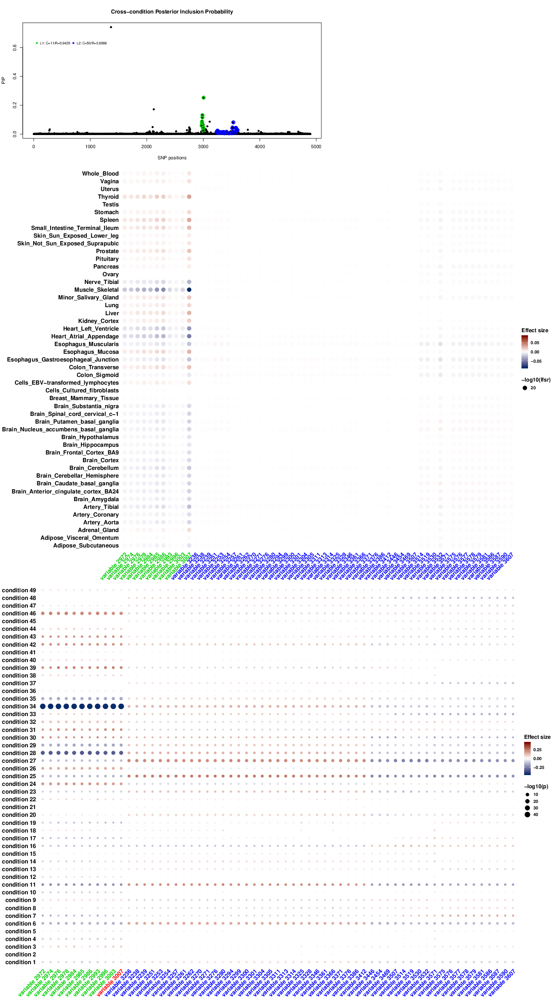

In [30]:
%preview ~/ENSG00000272030.1.Multi_Tissues.mnm_flash.png

## The bad

This does not happen too often (2 out of 26 analysis), but still not rare events:

> /home/gaow/ENSG00000120088.14.Multi_Tissues.mnm_flash.png (510.0 KiB):

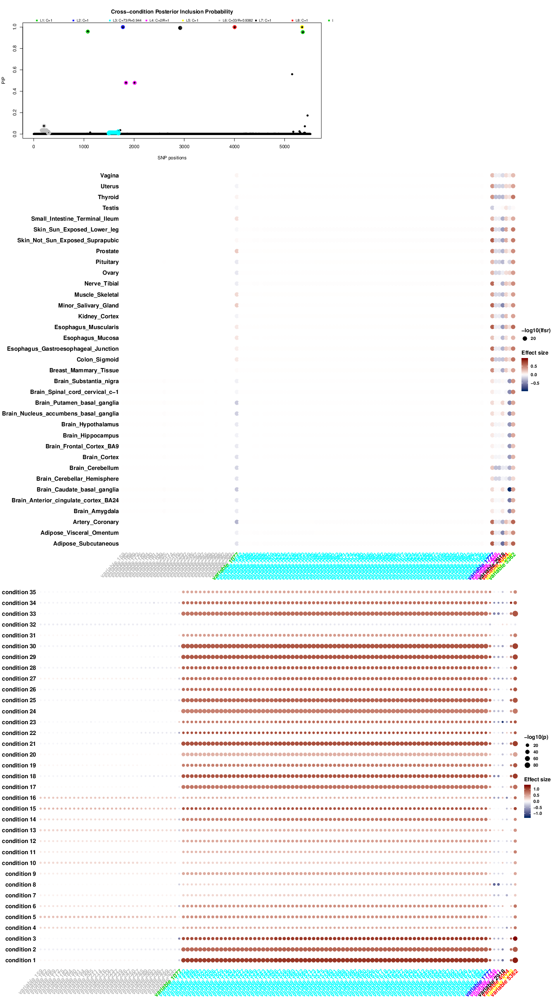

In [31]:
%preview ~/ENSG00000120088.14.Multi_Tissues.mnm_flash.png

> /home/gaow/ENSG00000249846.6.Multi_Tissues.mnm_flash.png (707.8 KiB):

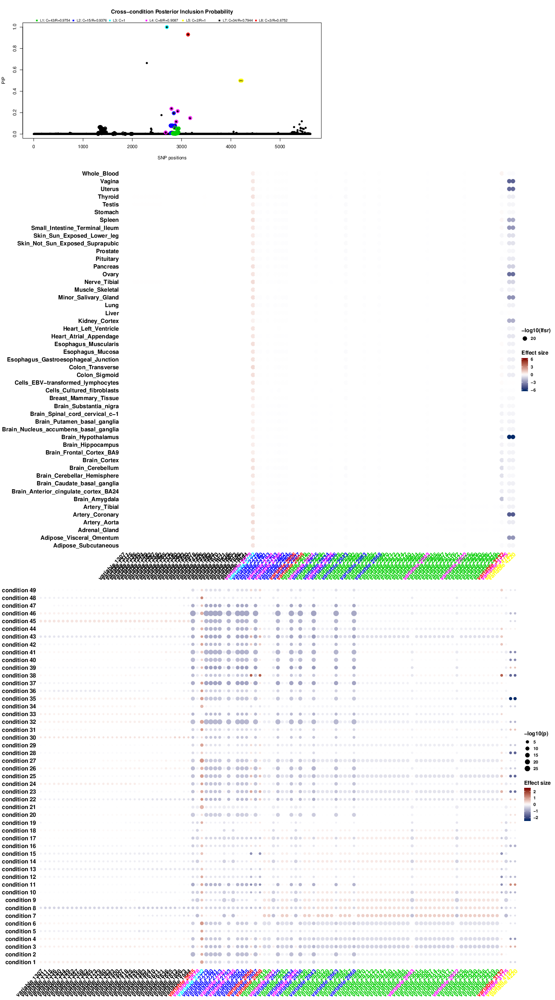

In [32]:
%preview ~/ENSG00000249846.6.Multi_Tissues.mnm_flash.png

But with `diag` method for residual covariance we get this all the time, for example for the same data `ENSG00000104472.9`, the first example in the "good" example section, if we use `diag` method,

> /home/gaow/ENSG00000104472.9.Multi_Tissues.mnm_diag.png (178.2 KiB):

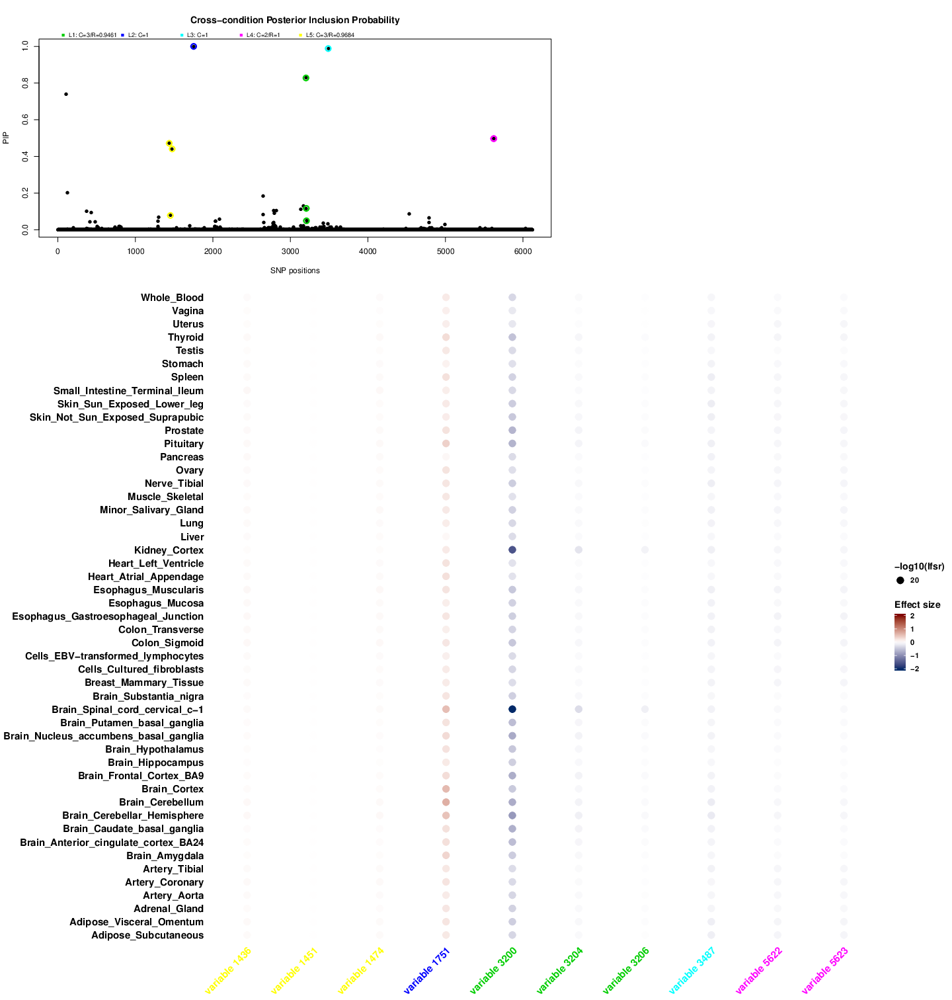

In [33]:
%preview ~/ENSG00000104472.9.Multi_Tissues.mnm_diag.png

## Results from simple z-null based covariance

Not very promising.

In [1]:
%cd ~/tmp/29-Oct-2019/output

/home/gaow/tmp/29-Oct-2019/output

> ENSG00000177084.16.Multi_Tissues.mnm_znull.png (377.2 KiB):

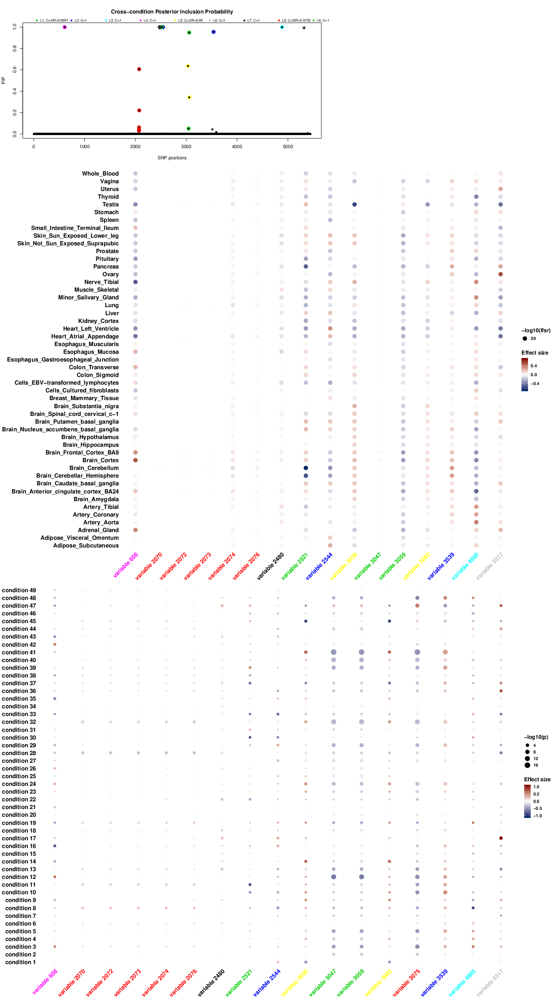

In [2]:
%preview ENSG00000177084.16.Multi_Tissues.mnm_znull.png

> ENSG00000104472.9.Multi_Tissues.mnm_znull.png (312.9 KiB):

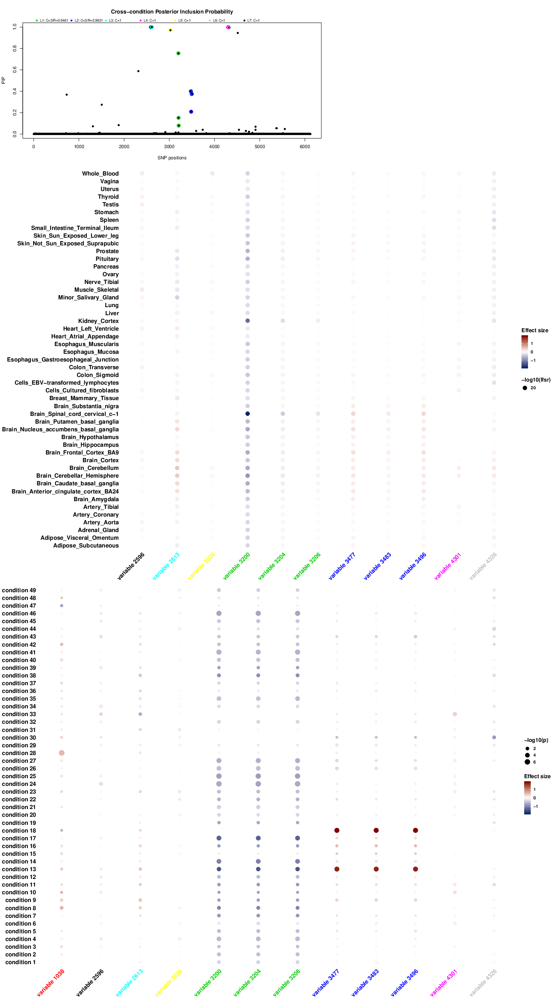

In [3]:
%preview ENSG00000104472.9.Multi_Tissues.mnm_znull.png

> ENSG00000135744.7.Multi_Tissues.mnm_znull.png (429.8 KiB):

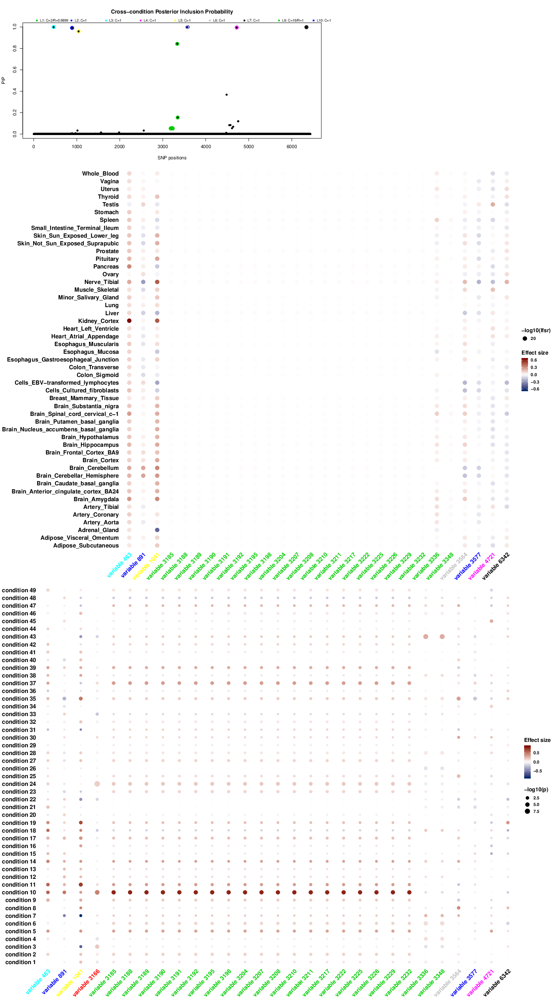

In [4]:
%preview ENSG00000135744.7.Multi_Tissues.mnm_znull.png

> ENSG00000160766.14.Multi_Tissues.mnm_znull.png (326.7 KiB):

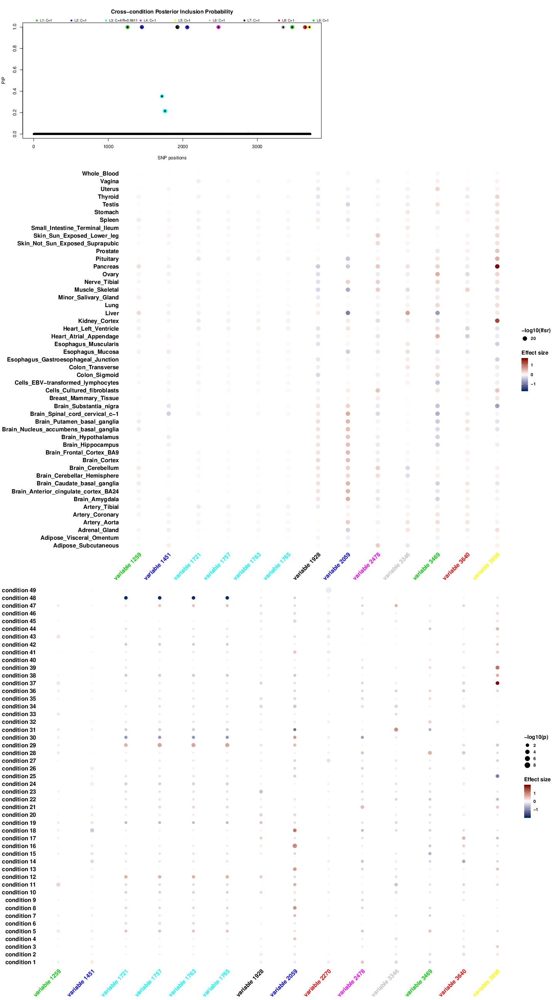

In [5]:
%preview ENSG00000160766.14.Multi_Tissues.mnm_znull.png 

> ENSG00000198794.11.Multi_Tissues.mnm_znull.png (374.4 KiB):

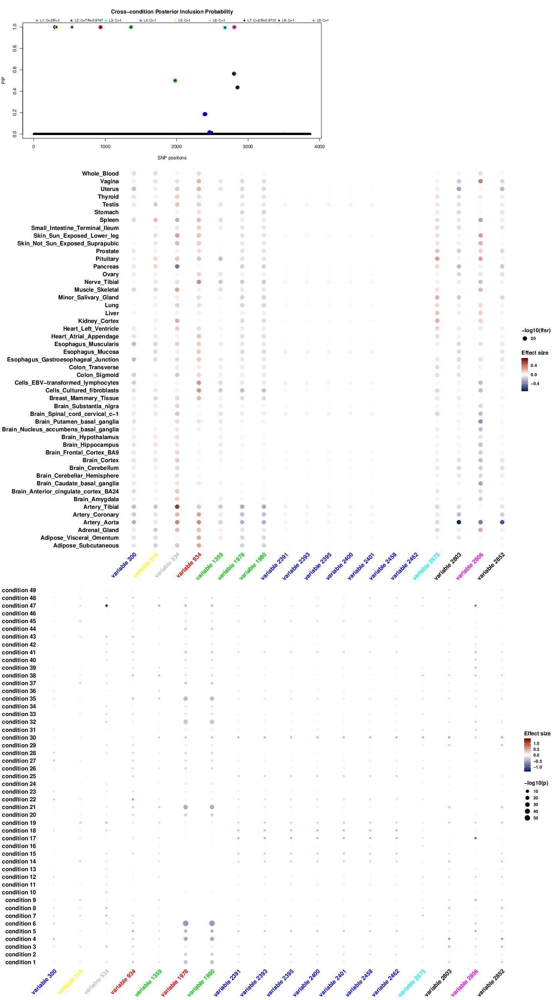

In [6]:
%preview ENSG00000198794.11.Multi_Tissues.mnm_znull.png

> ENSG00000136059.14.Multi_Tissues.mnm_znull.png (425.0 KiB):

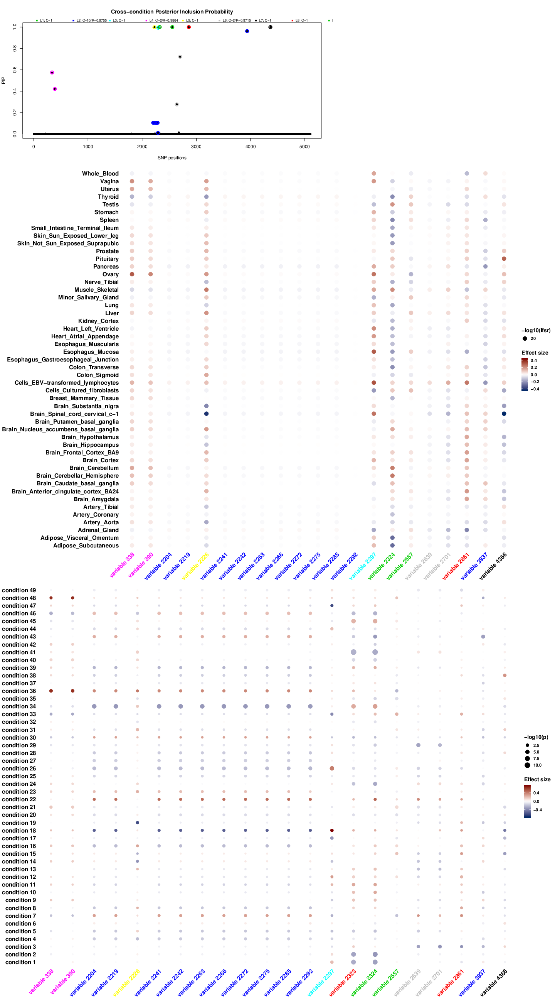

In [7]:
%preview ENSG00000136059.14.Multi_Tissues.mnm_znull.png

> ENSG00000272030.1.Multi_Tissues.mnm_znull.png (344.2 KiB):

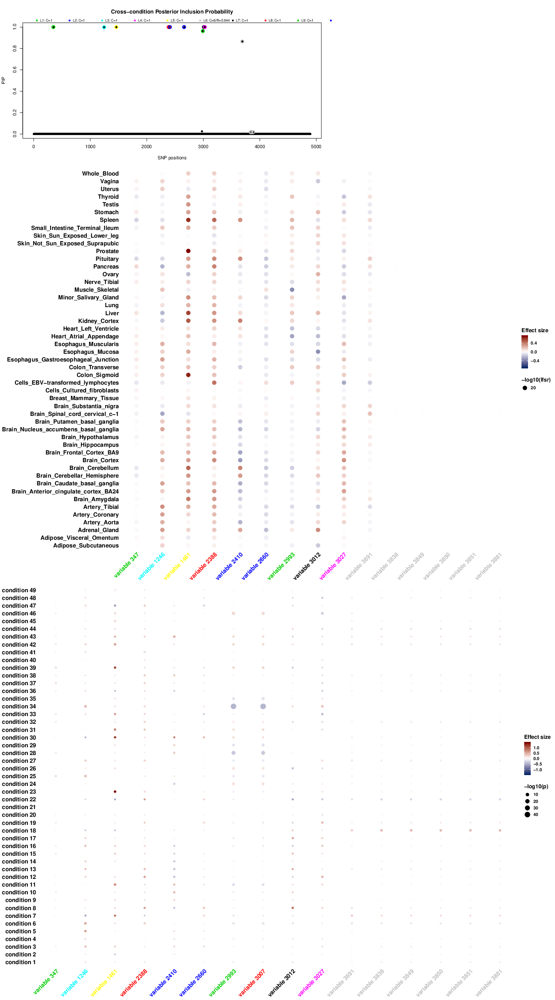

In [8]:
%preview ENSG00000272030.1.Multi_Tissues.mnm_znull.png

> ENSG00000120088.14.Multi_Tissues.mnm_znull.png (401.8 KiB):

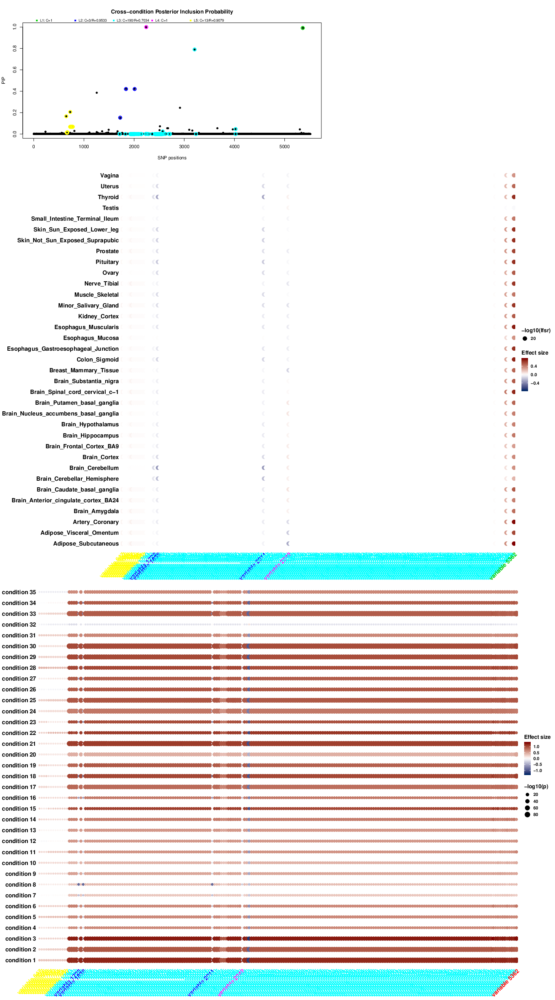

In [9]:
%preview ENSG00000120088.14.Multi_Tissues.mnm_znull.png

> ENSG00000249846.6.Multi_Tissues.mnm_znull.png (434.4 KiB):

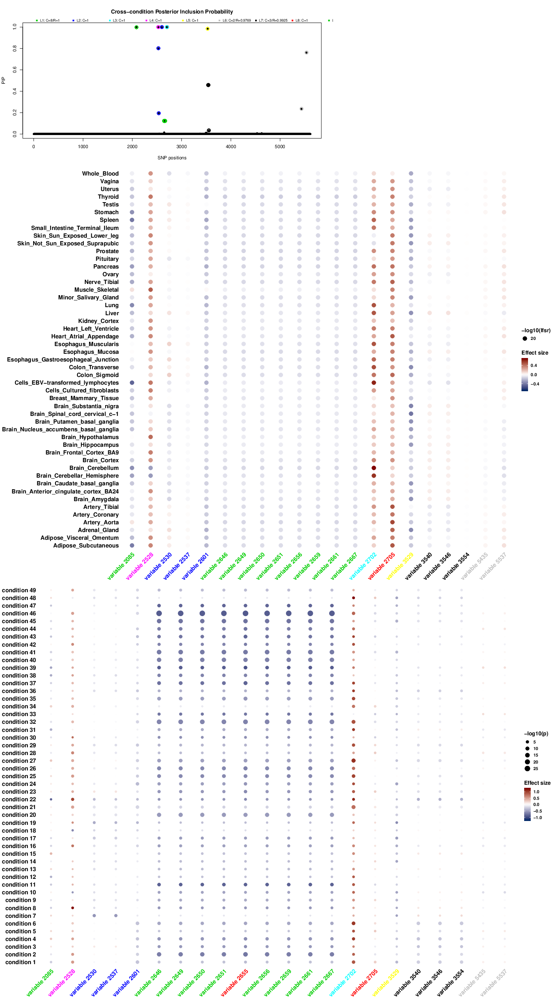

In [10]:
%preview ENSG00000249846.6.Multi_Tissues.mnm_znull.png

## Next steps for this investigation

In fact, as later shown in a [simulation benchmark](https://gaow.github.io/mvarbvs/analysis/20191108_MNM_Benchmark.html) we are still suffering from issues with analysis with missing data. Something is not quite right there.
Please see section "Next steps for this investigation" on that page.

Additionally, I want to

- Improve visualization -- eg. plot actual effect size.